# Varioational Autoencoder with Fashion-MNSIT Dataset

### Hardware Check

In [1]:
def get_hardware_info(use_in_notebook=True, install_packages=True):
    import platform
    system_name = platform.system()

    if install_packages:
        if system_name.lower() == "windows":
            %pip install psutil    # or: conda install psutil
            %pip install gputil
            %pip install py-cpuinfo
        elif system_name.lower() == "linux":
            !pip install psutil    # or: conda install psutil
            !pip install gputil
            !pip install py-cpuinfo

    # import needed packages
    import psutil
    import GPUtil
    from cpuinfo import get_cpu_info

    if use_in_notebook:
        if install_packages:
            if system_name.lower() == "windows":
                %pip install ipython
            elif system_name.lower() == "linux":
                !pip install ipython

        from IPython.display import clear_output
        clear_output()

    print("-"*32, "\nYour Hardware:\n")

    # General
    print("    ---> General <---")
    print("Operatingsystem:", platform.system())
    print("Version:", platform.version())
    print("Architecture:", platform.architecture())
    print("Processor:", platform.processor())

    # GPU-Information
    print("\n    ---> GPU <---")
    gpus = GPUtil.getGPUs()
    for gpu in gpus:
        print("GPU Name:", gpu.name)
        print("VRAM Total:", gpu.memoryTotal, "MB")
        print("VRAM Used:", gpu.memoryUsed, "MB")
        print("Utilization:", gpu.load * 100, "%")

    # CPU-Information
    print("\n    ---> CPU <---")
    cpu_info = get_cpu_info()
    print("CPU-Name:", cpu_info["brand_raw"])
    print("CPU Kernels:", psutil.cpu_count(logical=False))
    print("Logical CPU-Kernels:", psutil.cpu_count(logical=True))
    print("CPU-Frequence:", psutil.cpu_freq().max, "MHz")
    print("CPU-Utilization:", psutil.cpu_percent(interval=1), "%")

    # RAM-Information
    print("\n    ---> RAM <---")
    ram = psutil.virtual_memory()
    print("RAM Total:", ram.total // (1024**3), "GB")
    print("RAM Available:", ram.available // (1024**3), "GB")
    print("RAM-Utilization:", ram.percent, "%")

    print(f"\n{'-'*32}")


get_hardware_info(use_in_notebook=True, install_packages=True)

-------------------------------- 
Your Hardware:

    ---> General <---
Operatingsystem: Linux
Version: #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
Architecture: ('64bit', 'ELF')
Processor: x86_64

    ---> GPU <---
GPU Name: Tesla T4
VRAM Total: 15360.0 MB
VRAM Used: 0.0 MB
Utilization: 0.0 %

    ---> CPU <---
CPU-Name: Intel(R) Xeon(R) CPU @ 2.20GHz
CPU Kernels: 1
Logical CPU-Kernels: 2
CPU-Frequence: 0.0 MHz
CPU-Utilization: 89.4 %

    ---> RAM <---
RAM Total: 12 GB
RAM Available: 11 GB
RAM-Utilization: 12.7 %

--------------------------------


### Imports

In [2]:
import os
from datetime import datetime

import numpy as np
import matplotlib.pyplot as plt
plt_style = 'seaborn-v0_8' if 'seaborn-v0_8' in plt.style.available else np.random.choice(plt.style.available)
plt.style.use(plt_style)
print(f"Using '{plt_style}''")

import tensorflow as tf
import tensorflow.keras.backend as K
from tensorflow.keras import (layers,
                                models,
                                datasets,
                                callbacks,
                                losses,
                                optimizers,
                                metrics)
from tensorflow.keras.utils import plot_model
%load_ext tensorboard

from scipy.stats import norm

Using 'seaborn-v0_8''


In [1]:
def imshow(img, title=None, image_width=10, axis=False,
           color_space="RGB", cols=1, use_original_sytle=False,
           hspace=0.2, wspace=0.2):
    """
    Visualizes one or multiple images.

    Image will be reshaped: [batch_size/images, width, height, channels]

    title can be None, str or a list of strings.
    """
    import cv2

    original_style = plt.rcParams.copy()

    img_shape = img.shape
    print(f"Got images with shape: {img_shape}")

    # tranform the image to the right form
    if len(img_shape) == 2:
        img = np.reshape(img, shape=(1, img.shape[0], img.shape[1], 1))
    elif len(img_shape) == 3:
        # check if multiple gray images or multiple images with channel
        if img.shape[2] < img.shape[0] and img.shape[1] == img.shape[2]:
            img = np.reshape(img, shape=(1, img.shape[0], img.shape[1], img.shape[3]))
        else:
            # there could be cases where this is wrong
            img = np.reshape(img, shape=(img.shape[0], img.shape[1], img.shape[3], 1))
        img = np.reshape(img, shape=(1, img.shape[0], img.shape[1], 1))
    elif len(img_shape) != 4:
        raise ValueError(f"Image(s) have wrong shape! Founded shape: {img.shape}.")

    print(f"Transformed shape to: {img_shape}")

    # Set visualization settings
    # aspect_ratio_width = img.shape[1] / img.shape[2]
    aspect_ratio = img.shape[2] / img.shape[1]

    n_images = img.shape[0]
    rows = n_images//cols + int(n_images % cols > 0)

    width = int(image_width * cols)
    height = int(image_width * rows * aspect_ratio)

    # set plt style
    if not use_original_sytle:
        plt_style = 'seaborn-v0_8' if 'seaborn-v0_8' in plt.style.available else np.random.choice(plt.style.available)
        plt.style.use(plt_style)
        print(f"Using '{plt_style}'' plotting style.")

    # plotting
    print(f"Making you a beautiful plot...")
    fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(width, height))
    ax = ax.ravel()
    fig.subplots_adjust(hspace=hspace, wspace=wspace)
    if type(title) == str:
        fig.suptitle(title, fontsize=128, y=0.95)

    for idx in range(len(ax)):
        cur_ax = ax[idx]

        if idx >= len(img):
            cur_ax.axis("off")
            continue

        cur_img = img[idx]

        if color_space.lower() == "bgr":
            cur_img = cv2.cvtColor(cur_img, cv2.COLOR_BGR2RGB)
            cmap = None
        elif color_space.lower() == "rgb":
            cur_img = cur_img
            cmap = None
        elif color_space.lower() == "hsv":
            cur_img = cv2.cvtColor(cur_img, cv2.COLOR_HSV2RGB)
            cmap = None
        elif color_space.lower() in ["gray", "grey", "g"]:
            cur_img = cur_img
            cmap = "gray"

        cur_ax.imshow(cur_img, cmap=cmap)

        if type(title) in [list, tuple]:
            cur_ax.set_title(title[idx], fontsize=64)
        if axis == False:
            cur_ax.axis("off")

    plt.show()

    if not use_original_sytle:
        # reset to original plt style
        plt.rcParams.update(original_style)


In [4]:
def get_cur_date_time_as_str():
    now = datetime.now()
    return f"{now.year:04}-{now.month:02}-{now.day:02}_{now.hour:02}-{now.minute:02}-{now.second:02}"

get_cur_date_time_as_str()

'2025-02-10_09-43-12'

In [16]:
EXPERIMENT_NAME = get_cur_date_time_as_str() + "_VAE"
LOG_DIR = "./logs/fit/" + get_cur_date_time_as_str()

CHANNELS = 3
EPOCHS = 10
BATCH_SIZE = 128
LEARNING_RATE = 5e-4
NUM_FEATURES = 128    # which Conv extracts
LATENT_SPACE_DIMS = 200
BETA = 2000    # weigthing from reconstruction loss, if laten space normal distributions look not standard than decrease this hyperpara

os.makedirs(f"./logs", exist_ok=True)
os.makedirs(f"./checkpoints", exist_ok=True)
os.makedirs(f"./models/{EXPERIMENT_NAME}", exist_ok=True)
os.makedirs(LOG_DIR, exist_ok=True)
os.makedirs("./output/", exist_ok=True)

### Data Loading

CelebA Face Dataset from Kaggle.

**Kaggle API token loading**
1. Go to https://www.kaggle.com/ and create or sign in your account
2. Click on your profile picture > Settings and go to API
3. Click on 'Create New Token' and the 'kaggle.json' fie should download automatically
4. Now continue here:

In [6]:
# uploading kaggle API
from google.colab import files
files.upload()  # choose your local 'kaggle.json' file

# move to os kaggle
import os
import shutil
os.makedirs("/root/.kaggle", exist_ok=True)
if os.path.exists("/root/.kaggle/kaggle.json"):
    # shutil.rmtree("/root/.kaggle/kaggle.json")
    os.remove("/root/.kaggle/kaggle.json")
shutil.move("kaggle.json", "/root/.kaggle/")
os.chmod("/root/.kaggle/kaggle.json", 600)    # set right rights

# download kaggle dataset
#    -> dataset name just in the https link the last 2 items
if os.path.exists("/content/celeba-dataset.zip"):
    os.remove("/content/celeba-dataset.zip")
!kaggle datasets download -d jessicali9530/celeba-dataset

# Unzip the downloaded dataset
if os.path.exists("/content/dataset"):
    shutil.rmtree("/content/dataset")
!unzip -q "celeba-dataset.zip" -d dataset

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/jessicali9530/celeba-dataset
License(s): other
 98% 1.30G/1.33G [00:14<00:00, 230MB/s]
100% 1.33G/1.33G [00:14<00:00, 101MB/s]


In [7]:
train_data = tf.keras.utils.image_dataset_from_directory(
    "/content/dataset/img_align_celeba/img_align_celeba",
    labels=None,
    color_mode="rgb",
    image_size=(32,32),
    batch_size=128,
    shuffle=True,
    seed=42,
    interpolation="bilinear"
)
train_data

Found 202599 files.


<_PrefetchDataset element_spec=TensorSpec(shape=(None, 32, 32, 3), dtype=tf.float32, name=None)>

In [8]:
def preprocessing(img):
    img = tf.cast(img, "float32")/255.0
    return img

train = train_data.map(lambda x:preprocessing(x))
train

<_MapDataset element_spec=TensorSpec(shape=(None, 32, 32, 3), dtype=tf.float32, name=None)>

In [9]:
def sample_from_dataset(dataset, num_samples, random=False, data_loading_limit=None):
    samples = []
    sample_counter = 0

    # transform to list with numpy values
    for batch in dataset:
        samples += [batch.numpy()]
        sample_counter += batch.shape[0]

        if not random and sample_counter >= num_samples:
            break

        if data_loading_limit is not None and sample_counter >= data_loading_limit:
            break

    # merch numpy entries in python list to one numpy array
    samples = np.concatenate(samples, axis=0)

    if random:
        # random sample from it
        samples = np.random.choice(samples, num_samples)
    else:
        samples = samples[:num_samples]

    return samples

In [10]:
train_sample = sample_from_dataset(train, 50)
train_sample.shape

(50, 32, 32, 3)

Got images with shape: (50, 32, 32, 3)
Transformed shape to: (50, 32, 32, 3)
Using 'seaborn-v0_8'' plotting style.
Making you a beautiful plot...


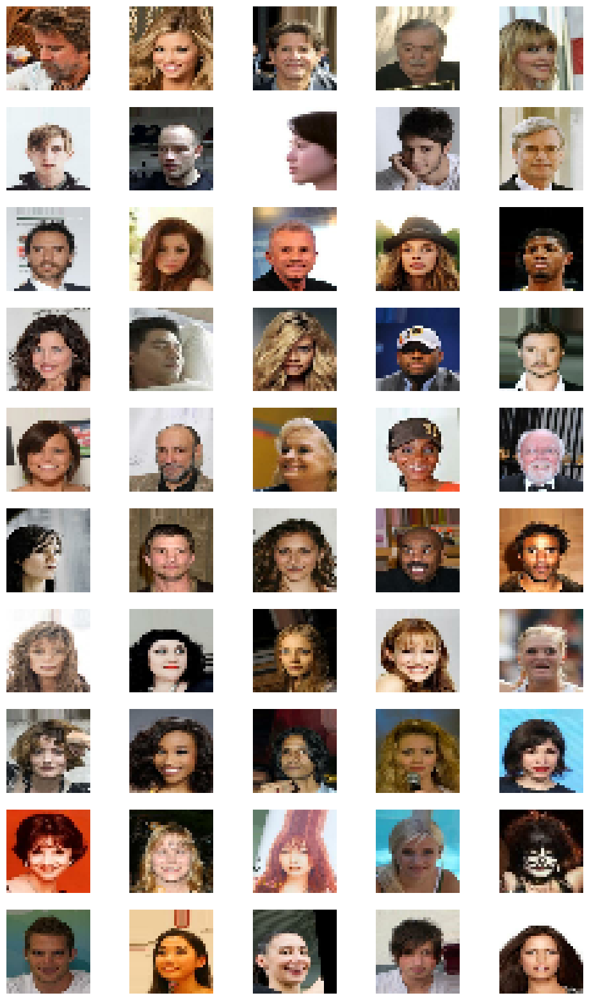

In [11]:
imshow(train_sample, title=None, size=10,
       axis=False, color_space="RGB", cols=5,
       use_original_sytle=False,
       hspace=0.2, wspace=0.2)

### Build the Model

Conv2DTranspose are equal to the Conv2D but the stride defines here how much padding should be applied between each datapoint.

In [12]:
class Sampling(layers.Layer):
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = K.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(z_log_var*0.5) * epsilon

In [13]:
# encoder
encoder_input = layers.Input(shape=(32,32,CHANNELS), name="eoncoder_input")

x = layers.Conv2D(NUM_FEATURES, (3,3), strides=2, padding="same", activation="relu")(encoder_input)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)

x = layers.Conv2D(NUM_FEATURES, (3,3), strides=2, padding="same", activation="relu")(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)

x = layers.Conv2D(NUM_FEATURES, (3,3), strides=2, padding="same", activation="relu")(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)

x = layers.Conv2D(NUM_FEATURES, (3,3), strides=2, padding="same", activation="relu")(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)

shape_before_flattening = K.int_shape(x)[1:]

x = layers.Flatten()(x)
z_mean = layers.Dense(LATENT_SPACE_DIMS, name="z_mean")(x)
z_log_var = layers.Dense(LATENT_SPACE_DIMS, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])

encoder = models.Model(encoder_input, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

# decoder
decoder_input = layers.Input(shape=(LATENT_SPACE_DIMS, ), name="decoder_input")

x = layers.Dense(np.prod(shape_before_flattening))(decoder_input)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Reshape(shape_before_flattening)(x)    # reshaping from a vector to an tensor

x = layers.Conv2DTranspose(NUM_FEATURES, (3,3), strides=2, padding="same", activation="relu")(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)

x = layers.Conv2DTranspose(NUM_FEATURES, (3,3), strides=2, padding="same", activation="relu")(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)

x = layers.Conv2DTranspose(NUM_FEATURES, (3,3), strides=2, padding="same", activation="relu")(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)

x = layers.Conv2DTranspose(NUM_FEATURES, (3,3), strides=2, padding="same", activation="relu")(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)

decoder_output = layers.Conv2DTranspose(
    CHANNELS,
    (3,3),
    strides=1,
    padding="same",
    activation="sigmoid",
    name="decoder_output"
)(x)

decoder = models.Model(decoder_input, decoder_output, name="decoder")
decoder.summary()


Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ eoncoder_input            │ (None, 32, 32, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 16, 16, 128)    │          3,584 │ eoncoder_input[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 16, 16, 128)    │            512 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu (LeakyReLU)   │ (None, 16, 16, 128)    │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 8, 8, 128)      │        147,584 │ leaky_re_lu[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 8, 8, 128)      │            512 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_1 (LeakyReLU) │ (None, 8, 8, 128)      │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 4, 4, 128)      │        147,584 │ leaky_re_lu_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 4, 4, 128)      │            512 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_2 (LeakyReLU) │ (None, 4, 4, 128)      │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 2, 2, 128)      │        147,584 │ leaky_re_lu_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 2, 2, 128)      │            512 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_3 (LeakyReLU) │ (None, 2, 2, 128)      │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 512)            │              0 │ leaky_re_lu_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 200)            │        102,600 │ flatten[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 200)            │        102,600 │ flatten[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sampling (Sampling)       │ (None, 200)            │              0 │ z_mean[0][0],          │
│                      

 Total params: 653,584 (2.49 MB)

 Trainable params: 652,560 (2.49 MB)

 Non-trainable params: 1,024 (4.00 KB)

Model: "decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ decoder_input (InputLayer)           │ (None, 200)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │         102,912 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_4 (LeakyReLU)            │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 2, 2, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 4, 4, 128)           │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 4, 4, 128)           │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_5 (LeakyReLU)            │ (None, 4, 4, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 8, 8, 128)           │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 8, 8, 128)           │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_6 (LeakyReLU)            │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_2 (Conv2DTranspose) │ (None, 16, 16, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_7 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_3 (Conv2DTranspose) │ (None, 32, 32, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_8 (LeakyReLU)            │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ decoder_output (Conv2DTranspose)     │ (None, 32, 32, 3)           │           3,459 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 700,803 (2.67 MB)

 Trainable params: 698,755 (2.67 MB)

 Non-trainable params: 2,048 (8.00 KB)

In [14]:
class VAE(models.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

        self.total_loss_tracker = metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = metrics.Mean(name="reconstruction_loss")
        self.kl_loss_tracker = metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker
        ]

    def call(self, inputs):
        z_mean, z_log_var, z = encoder(inputs)
        reconstruction = decoder(z)
        return z_mean, z_log_var, reconstruction

    def train_step(self, data):
        with tf.GradientTape() as tape:
            z_mean, z_log_var, reconstruction = self(data)
            reconstruction_loss = tf.reduce_mean(
                BETA * losses.binary_crossentropy(data, reconstruction, axis=(1,2,3))
                )
            kl_loss = tf.reduce_mean(tf.reduce_sum(
                                -0.5*(1+z_log_var-tf.square(z_mean)-tf.exp(z_log_var)),
                                axis=1
                        ))
            total_loss = reconstruction_loss + kl_loss

        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))

        self.total_loss_tracker.update_state(total_loss)

        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)

        return{cur_metric.name:cur_metric.result() for cur_metric in self.metrics}

    def test_step(self, data):
        """
        Step run during validation
        """
        if isinstance(data, tuple):
            data = data[0]

        z_mean, z_log_var, reconstruction = self(data)
        reconstruction_loss = tf.reduce_mean(
            BETA * losses.binary_crossentropy(data, reconstruction, axis=(1, 2, 3))
        )
        kl_loss = tf.reduce_mean(tf.reduce_sum(
                -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)),
                axis=1,
        ))
        total_loss = reconstruction_loss + kl_loss

        return {
            "loss": total_loss,
            "reconstruction_loss": reconstruction_loss,
            "kl_loss": kl_loss,
        }


vae = VAE(encoder, decoder)
# vae.build(input_shape=(None, 32, 32, 1))


### Compile and train the model

In [15]:
# callbacks

model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath=f"./checkpoint/{EXPERIMENT_NAME}.keras",
    save_weights_only=False,
    save_freq="epoch",
    monitor="loss",
    mode="min",
    save_best_only=True,
    verbose=0,
)

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=LOG_DIR, histogram_freq=1)

class ImageGenerator(tf.keras.callbacks.Callback):
    def __init__(self, num_img, latent_dim):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(
            shape=(self.num_img, self.latent_dim)
        )
        generated_images = self.model.decoder(random_latent_vectors)
        generated_images *= 255
        generated_images.numpy()
        for i in range(self.num_img):
            img = tf.keras.utils.array_to_img(generated_images[i])
            img.save(f"./output/generated_img_{epoch:03}_{i}.png")

In [17]:
# add optimizer and compile the model
optimizer = optimizers.Adam(learning_rate=LEARNING_RATE)
vae.compile(optimizer=optimizer)

# train the model
vae.fit(
    train,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    shuffle=True,
    callbacks=[model_checkpoint_callback,
               tensorboard_callback,
               ImageGenerator(num_img=10, latent_dim=LATENT_SPACE_DIMS)]
)

Epoch 1/10
1583/1583 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - kl_loss: 21.1816 - reconstruction_loss: 1155.7543 - total_loss: 1176.9358

/usr/local/lib/python3.10/dist-packages/keras/src/callbacks/model_checkpoint.py:206: UserWarning: Can save best model only with loss available, skipping.
  self._save_model(epoch=epoch, batch=None, logs=logs)


1583/1583 ━━━━━━━━━━━━━━━━━━━━ 111s 61ms/step - kl_loss: 21.1846 - reconstruction_loss: 1155.7202 - total_loss: 1176.9048
Epoch 2/10
1583/1583 ━━━━━━━━━━━━━━━━━━━━ 117s 51ms/step - kl_loss: 28.1326 - reconstruction_loss: 1060.3925 - total_loss: 1088.5239
Epoch 3/10
1583/1583 ━━━━━━━━━━━━━━━━━━━━ 85s 53ms/step - kl_loss: 30.5357 - reconstruction_loss: 1046.5933 - total_loss: 1077.1295
Epoch 4/10
1583/1583 ━━━━━━━━━━━━━━━━━━━━ 133s 47ms/step - kl_loss: 31.3656 - reconstruction_loss: 1042.2168 - total_loss: 1073.5825
Epoch 5/10
1583/1583 ━━━━━━━━━━━━━━━━━━━━ 84s 49ms/step - kl_loss: 31.9923 - reconstruction_loss: 1039.8451 - total_loss: 1071.8378
Epoch 6/10
1583/1583 ━━━━━━━━━━━━━━━━━━━━ 83s 50ms/step - kl_loss: 32.4849 - reconstruction_loss: 1038.0483 - total_loss: 1070.5326
Epoch 7/10
1583/1583 ━━━━━━━━━━━━━━━━━━━━ 87s 53ms/step - kl_loss: 33.0081 - reconstruction_loss: 1036.5365 - total_loss: 1069.5446
Epoch 8/10
1583/1583 ━━━━━━━━━━━━━━━━━━━━ 92s 58ms/step - kl_loss: 33.3520 - reconst

In [18]:
get_hardware_info(use_in_notebook=True, install_packages=False)

-------------------------------- 
Your Hardware:

    ---> General <---
Operatingsystem: Linux
Version: #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
Architecture: ('64bit', 'ELF')
Processor: x86_64

    ---> GPU <---
GPU Name: Tesla T4
VRAM Total: 15360.0 MB
VRAM Used: 1678.0 MB
Utilization: 0.0 %

    ---> CPU <---
CPU-Name: Intel(R) Xeon(R) CPU @ 2.20GHz
CPU Kernels: 1
Logical CPU-Kernels: 2
CPU-Frequence: 0.0 MHz
CPU-Utilization: 2.5 %

    ---> RAM <---
RAM Total: 12 GB
RAM Available: 9 GB
RAM-Utilization: 26.2 %

--------------------------------


In [19]:
# Save the final models
vae.save(f"./models/{EXPERIMENT_NAME}/vae.keras")
encoder.save(f"./models/{EXPERIMENT_NAME}/encoder.keras")
decoder.save(f"./models/{EXPERIMENT_NAME}/decoder.keras")

# vae.load_weights("./models/vae")
# tmp = vae.predict(train.take(1))

In [20]:
%tensorboard --logdir ./logs/fit

<IPython.core.display.Javascript object>

### Evaluation

**Check some examples**

In [21]:
batches_to_predict = 1
X_test = np.array(
    list(train.take(batches_to_predict).get_single_element())
)

In [23]:
X_test.shape

(128, 32, 32, 3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


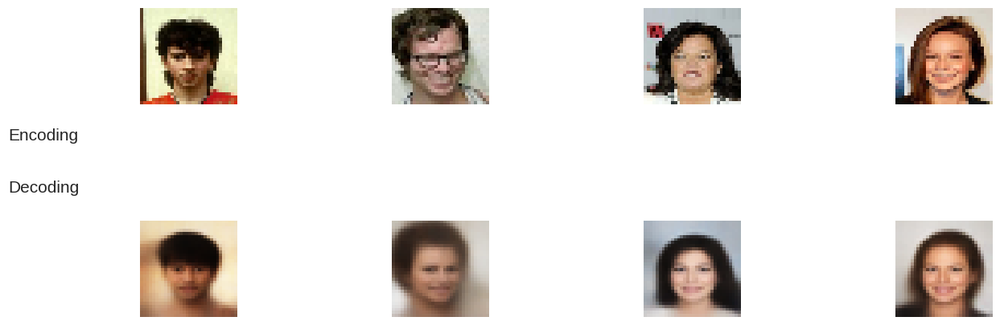

In [30]:
images_to_show = 4
image_idxs = np.random.choice(range(len(X_test)), images_to_show)

images = X_test[image_idxs]
# embeddings = encoder.predict(X_test[image_idxs])
# reconstructions = decoder.predict(embeddings)
z_mean, z_log_var, reconstructions = vae.predict(images)

rows = 2
cols = images_to_show // 1 + (images_to_show % 1 > 0)

fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(15, 5))
fig.subplots_adjust(hspace=1.2, wspace=0.4)

for i, (image, cur_z_mean, cur_z_log_var, reconstruction) in enumerate(zip(images, z_mean, z_log_var, reconstructions)):
    ax[0,i].axis('off')
    # ax[0,i].text(0.5, -0.5, f"Mean: {np.round(cur_z_mean, 2)}", fontsize=12, ha='center', transform=ax[0,i].transAxes)
    # ax[0,i].text(0.5, -0.7, f"Log-Var: {np.round(cur_z_log_var, 2)}", fontsize=12, ha='center', transform=ax[0,i].transAxes)
    ax[0,i].imshow(image, cmap="gray")

    ax[1,i].axis('off')
    ax[1,i].imshow(reconstruction, cmap="gray")

fig.text(0.05, 0.55, "Encoding", fontsize=15)
fig.text(0.05, 0.42, "Decoding", fontsize=15)

plt.show();

**Check Learned Distributions in Latent Space**

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step


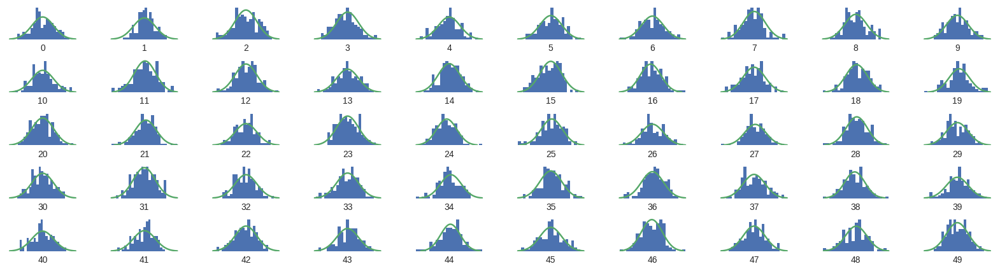

In [32]:
_, _, z = vae.encoder.predict(X_test)

x = np.linspace(-3, 3, 100)

fig = plt.figure(figsize=(20, 5))
fig.subplots_adjust(hspace=0.6, wspace=0.4)

for i in range(50):
    ax = fig.add_subplot(5, 10, i + 1)
    ax.hist(z[:, i], density=True, bins=20)
    ax.axis("off")
    ax.text(
        0.5, -0.35, str(i), fontsize=10, ha="center", transform=ax.transAxes
    )
    ax.plot(x, norm.pdf(x))

plt.show()

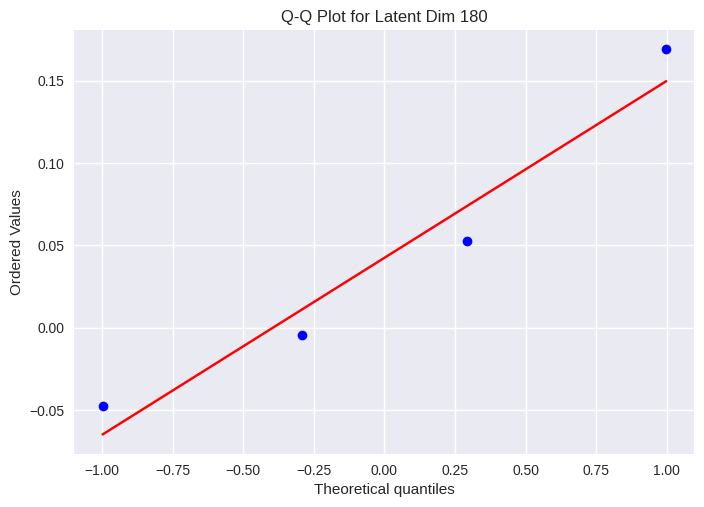

In [36]:
import scipy.stats as stats

dim_to_plot = 180  # Select latent dimension
stats.probplot(z_mean[:, dim_to_plot], dist="norm", plot=plt)
plt.title(f"Q-Q Plot for Latent Dim {dim_to_plot}")
plt.show()

FIXME -> fix the following plot!

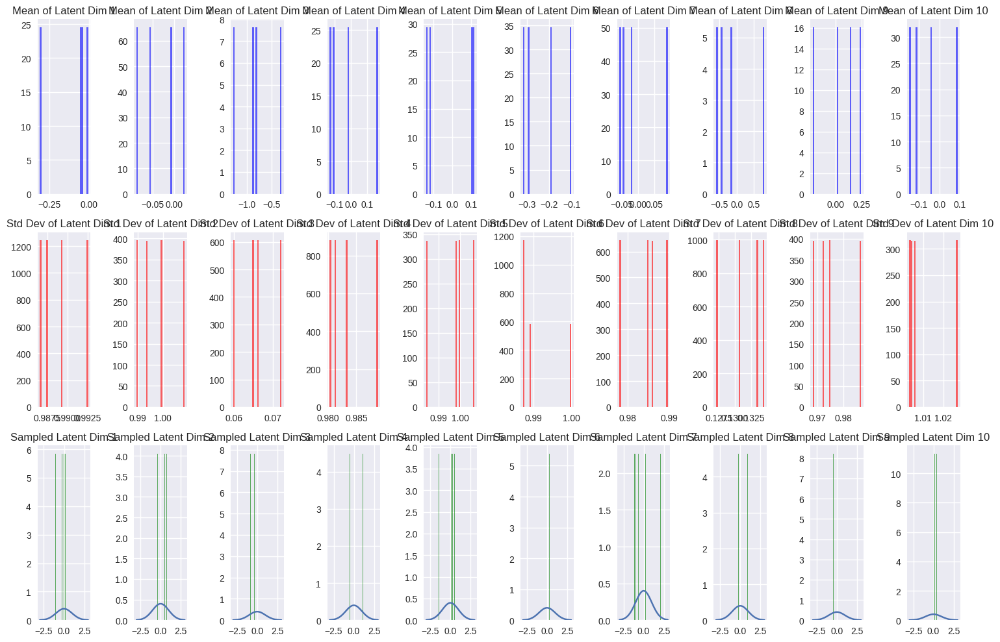

In [ ]:
# number of dimensions to visualize
#    -> for every input item it creates a an embedding => a distribution
num_examples = 10
num_examples = min(num_examples, len(z_mean)-1)

z_mean, z_log_var, z = vae.encoder.predict(X_test)

# calc standard deviation from log variance
z_std = np.exp(0.5 * z_log_var)

x = np.linspace(-3, 3, 100)

fig, axes = plt.subplots(num_examples, 3, figsize=(15, 5*num_examples))

for i in range(num_examples):
    # plot the mean values
    axes[i, 0].hist(z_mean[:, i], bins=20, density=True, alpha=0.6, color='b')
    axes[i, 0].set_title(f"Mean of Latent Dim {i+1}")
    axes[i, 0].plot(x, norm.pdf(x))

    # plot the standard deviation
    axes[i, 1].hist(z_std[:, i], bins=30, density=True, alpha=0.6, color='r')
    axes[i, 1].set_title(f"Std Dev of Latent Dim {i+1}")
    axes[i, 1].plot(x, norm.pdf(x))

    # plot of latent-space samples
    axes[i, 2].hist(z_samples[:, i], bins=30, density=True, alpha=0.6, color='g')
    axes[i, 2].set_title(f"Sampled Latent Dim {i+1}")
    axes[i, 2].plot(x, norm.pdf(x))

plt.tight_layout()
plt.show()

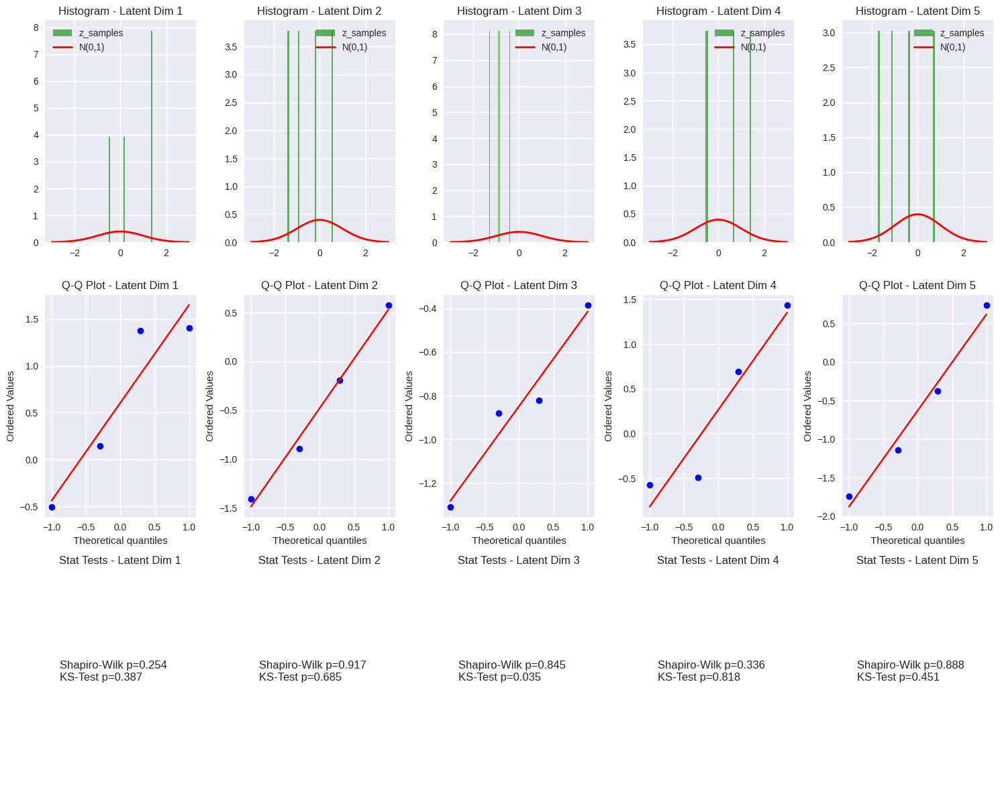

In [42]:
import scipy.stats as stats

# Berechnung der Standardabweichung
z_std = np.exp(0.5 * z_log_var)
# Sampling der latenten Variablen
z_samples = z_mean + z_std * np.random.randn(*z_mean.shape)

# Anzahl der zu testenden Dimensionen (max. 5)
num_dims_to_show = min(5, z_samples.shape[1])

fig, axes = plt.subplots(3, num_dims_to_show, figsize=(15, 12))

for i in range(num_dims_to_show):
    # histogram comparison
    axes[0, i].hist(z_samples[:, i], bins=30, density=True, alpha=0.6, color='g', label="z_samples")
    x = np.linspace(-3, 3, 100)
    axes[0, i].plot(x, stats.norm.pdf(x, 0, 1), 'r-', lw=2, label="N(0,1)")
    axes[0, i].set_title(f"Histogram - Latent Dim {i+1}")
    axes[0, i].legend()

    # Q-Q Plot
    stats.probplot(z_samples[:, i], dist="norm", plot=axes[1, i])
    axes[1, i].set_title(f"Q-Q Plot - Latent Dim {i+1}")

    # Nromality test
    shapiro_p = stats.shapiro(z_samples[:, i])[1]
    ks_p = stats.kstest(z_samples[:, i], 'norm', args=(0, 1))[1]
    axes[2, i].text(0.1, 0.5, f"Shapiro-Wilk p={shapiro_p:.3f}\nKS-Test p={ks_p:.3f}", fontsize=12)
    axes[2, i].axis("off")
    axes[2, i].set_title(f"Stat Tests - Latent Dim {i+1}")

plt.tight_layout()
plt.show()

THe Shapiro-Wilk-Test returns a p value which tries to prrof, that the distribution is not normal standard distributed.

p > 0.05 means that there is no significant different to the normal standard distribution

p < 0.05 means that there is a significants that the distribution is different to the normal standard distribution

**Visualize Latent Space**

16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step


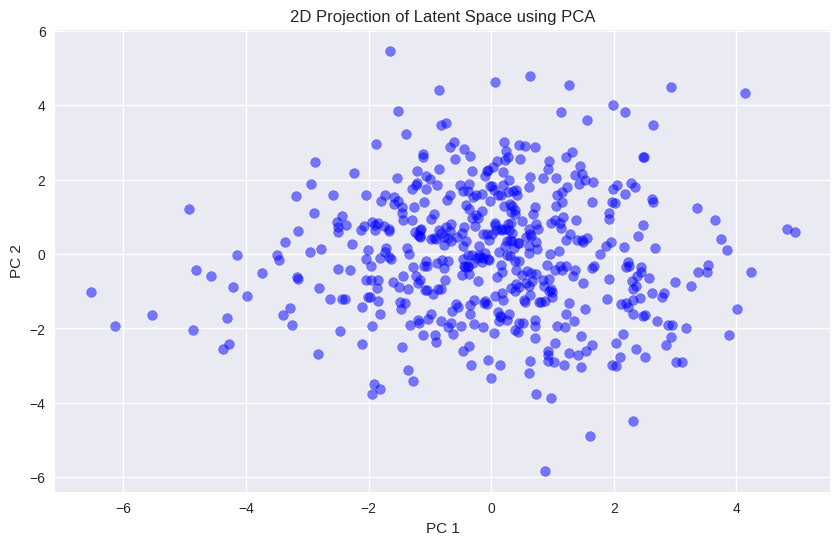

In [43]:
from sklearn.decomposition import PCA

images_to_show = 500
image_idxs = np.random.choice(range(len(X_test)), images_to_show)

images = X_test[image_idxs]
z_mean, z_log_var, embeddings = encoder.predict(X_test[image_idxs])
reconstructions = decoder.predict(embeddings)

# using dimension reduction to reduce the latent space
if embeddings.shape[-1] > 2:
    pca = PCA(n_components=2)
    embeddings = pca.fit_transform(embeddings)

plt.figure(figsize=(10, 6))
plt.scatter(embeddings[:, 0], embeddings[:, 1], c='blue', s=50, alpha=0.5)
plt.title("2D Projection of Latent Space using PCA")
plt.xlabel("PC 1")
plt.ylabel("PC 2")
plt.show()

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


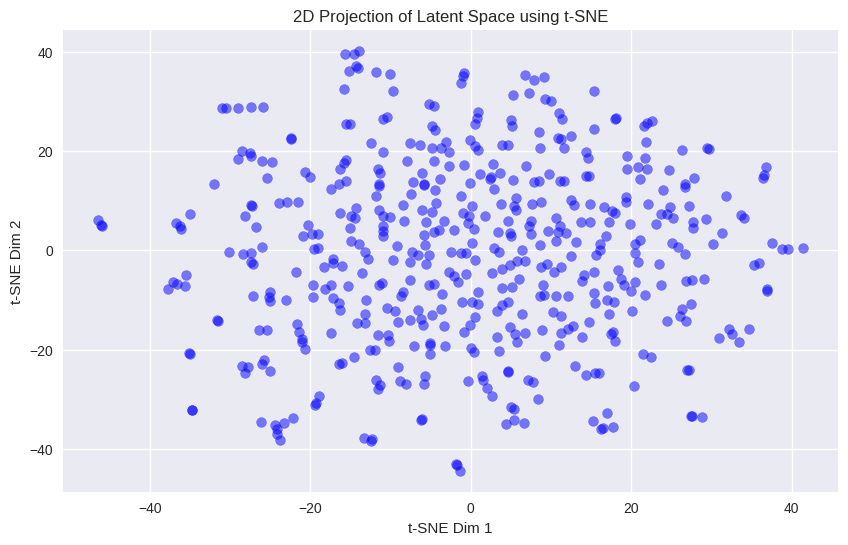

In [44]:
from sklearn.manifold import TSNE

images_to_show = 500
image_idxs = np.random.choice(range(len(X_test)), images_to_show)

images = X_test[image_idxs]
z_mean, z_log_var, embeddings = encoder.predict(X_test[image_idxs])
reconstructions = decoder.predict(embeddings)

# using dimension reduction to reduce the latent space
if embeddings.shape[-1] > 2:
    tsne = TSNE(n_components=2, perplexity=10, random_state=42)
    embeddings = tsne.fit_transform(embeddings)

plt.figure(figsize=(10, 6))
plt.scatter(embeddings[:, 0], embeddings[:, 1], c='blue', s=50, alpha=0.5)
plt.title("2D Projection of Latent Space using t-SNE")
plt.xlabel("t-SNE Dim 1")
plt.ylabel("t-SNE Dim 2")
plt.show()

In [54]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.4/383.4 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 20.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 7.4 MB/s eta 0:00:00


In [59]:
!pip install umap-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 5.0 MB/s eta 0:00:00


In [ ]:
import umap

In [62]:
import importlib

importlib.reload(umap)

<module 'umap' from '/usr/local/lib/python3.10/dist-packages/umap/__init__.py'>

/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Using 'seaborn-v0_8'' plotting style.

--------------------------------
Please remember following for interpretation:
- PCA for global informations (distances from clusters to each other)
- t-SNE for local informations (distances from each point to his neighbors but not from the clusters!)
- UMAP for global and local informations


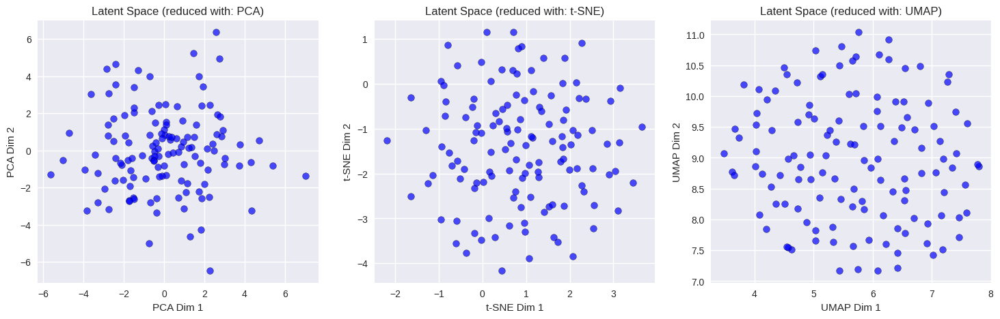

In [74]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score

import optuna
import umap    # UMAP uses graphs to reduces the dimensions



def reduce_to_2_dims(latent_space:np.ndarray, reduction_methods=["PCA", "TSNE", "UMAP"], fill_return_with_none=False, labels=None):
    """
    This function uses hyperparamter optimization to reduce the latent sace to 2 dimensions.
    Dimension reduction methods: PCA, t-SNE and UMAP.

    Please notice following for interpretation:
    - PCA for global informations (distances from clusters to each other)
    - t-SNE for local informations (distances from each point to his neighbors but not from the clusters!)
    - UMAP for global and local informations
    """

    if len(reduction_methods) < 1 or len(reduction_methods) > 3:
        raise ValueError(f"Parameter 'reduction_methods' must have 1 to 3 str items!")

    if any([rms not in ["PCA", "TSNE", "UMAP"] for rms in reduction_methods]):
        raise ValueError(f"Found an not allowed value in 'reduction_methods'. Expected 1-3 values from: ['PCA', 'TSNE', 'UMAP'] got: {reduction_methods}")

    # Optimizationfunction for Optuna (for t-SNE & UMAP)
    def objective_tsne(trial):
        perplexity = trial.suggest_int("perplexity", 5, 50)
        n_iter = trial.suggest_int("n_iter", 250, 2000)

        tsne = TSNE(n_components=2, perplexity=perplexity, n_iter=n_iter, random_state=42)
        X_embedded = tsne.fit_transform(latent_space)

        return silhouette_score(X_embedded, labels)  # Cluster-Qualität messen

    def objective_umap(trial):
        n_neighbors = trial.suggest_int("n_neighbors", 5, 50)
        min_dist = trial.suggest_float("min_dist", 0.0, 0.99)

        reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2, random_state=42)
        X_embedded = reducer.fit_transform(latent_space)

        return silhouette_score(X_embedded, labels)

    # hyperparameter optimization
    if "TSNE" in reduction_methods and labels:
        print("Optimizing t-SNE hyperparameters...")
        study_tsne = optuna.create_study(direction="maximize")
        study_tsne.optimize(objective_tsne, n_trials=30)
        best_tsne_params = study_tsne.best_params
    else:
        best_tsne_params = dict()
        best_tsne_params["perplexity"] = 30
        best_tsne_params["max_iter"] = 1000

    if "UMAP" in reduction_methods and labels:
        print("Optimizing UMAP hyperparameters...")
        study_umap = optuna.create_study(direction="maximize")
        study_umap.optimize(objective_umap, n_trials=30)
        best_umap_params = study_umap.best_params
    else:
        best_umap_params = dict()
        best_umap_params["n_neighbors"] = 15
        best_umap_params["min_dist"] = 0.1

    # reduction to 2 dimensions
    return_values = None

    # PCA
    if "PCA" in reduction_methods:
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(latent_space)
        return_values = X_pca
    elif fill_return_with_none:
        return_values = [None]

    # t-SNE with best parameters
    if "TSNE" in reduction_methods:
        tsne = TSNE(n_components=2, perplexity=best_tsne_params['perplexity'],
                    max_iter=best_tsne_params['max_iter'], random_state=42)
        X_tsne = tsne.fit_transform(latent_space)
        before_values = return_values if type(return_values) == list else [return_values]
        return_values = X_tsne if return_values is None else before_values + [X_tsne]
    elif fill_return_with_none:
        return_values += [None]

    # UMAP with best parameters
    if "UMAP" in reduction_methods:
        umap_reducer = umap.UMAP(n_neighbors=best_umap_params['n_neighbors'],
                                min_dist=best_umap_params['min_dist'],
                                n_components=2, random_state=42)
        X_umap = umap_reducer.fit_transform(latent_space)
        before_values = return_values if type(return_values) == list else [return_values]
        return_values = X_umap if return_values is None else before_values + [X_umap]
    elif fill_return_with_none:
        return_values += [None]

    return return_values

def plot(latent_space:np.ndarray, reduction_methods=["PCA", "TSNE", "UMAP"],
                        labels=None, figsize=(18, 5), cmap="viridis"):
    """
    This function uses hyperparamter optimization to reduce the latent sace to 2 dimensions.
    Then visualizing the latent space with PCA, t-SNE and UMAP.

    Please notice following for interpretation:
    - PCA for global informations (distances from clusters to each other)
    - t-SNE for local informations (distances from each point to his neighbors but not from the clusters!)
    - UMAP for global and local informations

    Example cmap values:
    - None
    - viridis: Eine der beliebtesten Colormaps, die von dunkelblau bis gelb reicht.
    - plasma: Reicht von dunkelviolett bis gelb-orange.
    - inferno: Reicht von dunkelviolett bis gelb.
    - magma: Reicht von dunkelviolett bis hellorange.
    - cividis: Eine farbenblinde freundliche Variante von viridis.
    - Greys: Graustufen.
    - Blues: Blautöne.
    - Reds: Rottöne.
    - coolwarm: Verläuft von blau über weiß nach rot.
    - hsv: Farbton-Sättigung-Wert (HSV) Farbmodell.
    - jet: Traditionelle Colormap, die von blau über grün nach rot verläuft.
    """
    if len(reduction_methods) < 1 or len(reduction_methods) > 3:
        raise ValueError(f"Parameter 'reduction_methods' must have 1 to 3 str items!")

    if any([rms not in ["PCA", "TSNE", "UMAP"] for rms in reduction_methods]):
        raise ValueError(f"Found an not allowed value in 'reduction_methods'. Expected 1-3 values from: ['PCA', 'TSNE', 'UMAP'] got: {reduction_methods}")

    if not labels:
        labels = "blue"
        cmap = None

    # reduce to 2 dimensions
    X_pca, X_tsne, X_umap = reduce_to_2_dims(latent_space=latent_space, reduction_methods=reduction_methods, fill_return_with_none=True)

    # visualization
    original_style = plt.rcParams.copy()
    plt_style = 'seaborn-v0_8' if 'seaborn-v0_8' in plt.style.available else np.random.choice(plt.style.available)
    plt.style.use(plt_style)
    print(f"Using '{plt_style}'' plotting style.")

    fig, axs = plt.subplots(1, len(reduction_methods), figsize=figsize)

    idx = 0

    if "PCA" in reduction_methods:
        scatter = axs[idx].scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap=cmap, alpha=0.7, edgecolors='k', s=50)
        axs[idx].set_title("Latent Space (reduced with: PCA)")
        axs[idx].set_xlabel("PCA Dim 1")
        axs[idx].set_ylabel("PCA Dim 2")
        if type(labels) != str:
            axs[idx].colorbar(scatter, label="True Labels")
        idx += 1

    if "TSNE" in reduction_methods:
        scatter = axs[idx].scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels, cmap=cmap, alpha=0.7, edgecolors='k', s=50)
        axs[idx].set_title("Latent Space (reduced with: t-SNE)")
        axs[idx].set_xlabel("t-SNE Dim 1")
        axs[idx].set_ylabel("t-SNE Dim 2")
        if type(labels) != str:
            axs[idx].colorbar(scatter, label="True Labels")
        idx += 1

    if "UMAP" in reduction_methods:
        scatter = axs[idx].scatter(X_umap[:, 0], X_umap[:, 1], c=labels, cmap=cmap, alpha=0.7, edgecolors='k', s=50)
        axs[idx].set_title("Latent Space (reduced with: UMAP)")
        axs[idx].set_xlabel("UMAP Dim 1")
        axs[idx].set_ylabel("UMAP Dim 2")
        if type(labels) != str:
            axs[idx].colorbar(scatter, label="True Labels")


    print(f"\n{'-'*32}\nPlease remember following for interpretation:\n- PCA for global informations (distances from clusters to each other)\n- t-SNE for local informations (distances from each point to his neighbors but not from the clusters!)\n- UMAP for global and local informations")
    plt.show()

    # reset to original plt style
    plt.rcParams.update(original_style)


plot(z, reduction_methods=["PCA", "TSNE", "UMAP"],
     labels=None, figsize=(18, 5), cmap="viridis")

Through the encoding in normal distributions our encodings are distributed now way more central in the latent-space!

And because the kl-loss function the distribution have no real gaps (compare to autencoder)!

**Displaying Original, Embedding and Latent Space representation**

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


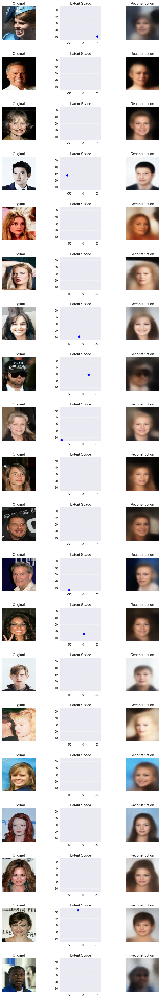

In [86]:
from sklearn.manifold import TSNE

images_to_show = 20
image_idxs = np.random.choice(range(len(X_test)), images_to_show)

images = X_test[image_idxs]
z_mean, z_log, embeddings = encoder.predict(X_test[image_idxs])
reconstructions = decoder.predict(embeddings)

# using dimension reduction to reduce the latent space
if embeddings.shape[-1] > 2:
    tsne = TSNE(n_components=2, perplexity=images_to_show*0.2)
    embeddings = tsne.fit_transform(embeddings)

x_lim = (np.min(embeddings[:, 0])-5, np.max(embeddings[:, 0])+5)
y_lim = (np.min(embeddings[0, :])-5, np.max(embeddings[0, :])+5)

rows = images_to_show
cols = 3  # Original, embedding visualization, reconstruction

fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(10, 3 * images_to_show))
fig.subplots_adjust(hspace=0.5, wspace=0.5)

for i, (image, embedding, reconstruction) in enumerate(zip(images, embeddings, reconstructions)):
    # Original Image
    ax[i, 0].imshow(image.squeeze(), cmap='gray')
    ax[i, 0].set_title("Original")
    ax[i, 0].axis('off')

    # Latent Space Representation (First Two Components)
    ax[i, 1].scatter(embedding[0], embedding[1], color='blue', s=50)
    ax[i, 1].set_xlim(x_lim[0], x_lim[1])
    ax[i, 1].set_ylim(y_lim[0], y_lim[1])
    ax[i, 1].set_title("Latent Space")
    ax[i, 1].grid(True, linestyle='--', alpha=0.5)

    # Reconstructed Image
    ax[i, 2].imshow(reconstruction.squeeze(), cmap='gray')
    ax[i, 2].set_title("Reconstruction")
    ax[i, 2].axis('off')

plt.show()

**Interpolating the latent space and visualize the decoding**

-> this helps to understand the latent space and how the decoder uses it

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


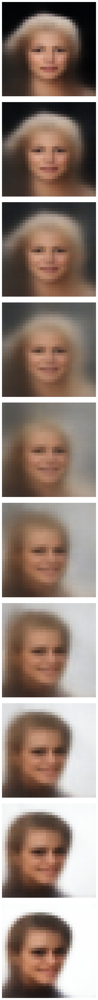

In [92]:
images = sample_from_dataset(train, num_samples=50000)
_, _, embeddings = encoder.predict(images)

n_interpolations = 10
alpha_values = np.linspace(0, 1, num=n_interpolations)
interpolated_images = []

for alpha in alpha_values:
    interp_embedding = (1 - alpha) * embeddings[0] + alpha * embeddings[1]
    interp_image = decoder.predict(interp_embedding.reshape(1, -1))
    interpolated_images.append(interp_image.squeeze())

fig, axes = plt.subplots(len(alpha_values), 1, figsize=(5, 5*len(alpha_values)))
for i, img in enumerate(interpolated_images):
    axes[i].imshow(img, cmap='gray')
    axes[i].axis('off')
    axes[i].set_xticks([])
    axes[i].set_yticks([])

fig.tight_layout()
plt.show()

### Generation of new Images

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 732ms/step


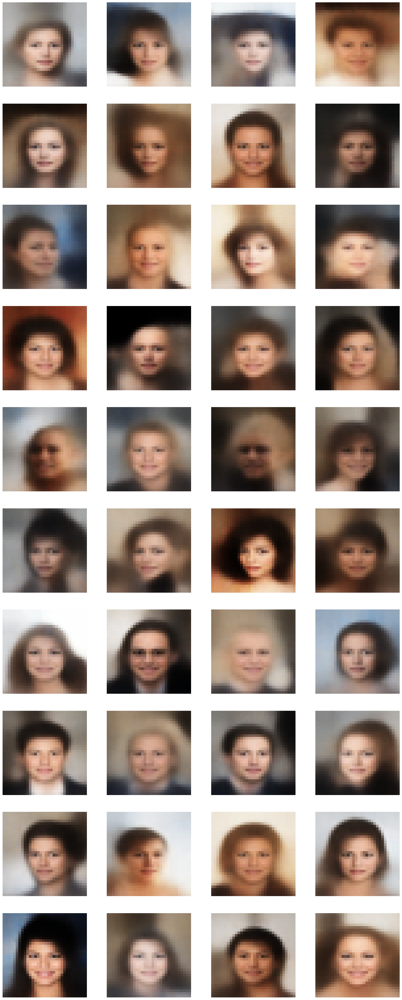

In [93]:
_, _, embeddings = encoder.predict(X_test)

n_samples = 40
sample = np.random.normal(size=(n_samples, LATENT_SPACE_DIMS))
reconstructions = decoder.predict(sample)

# visualization of new images
rows = 10
cols = len(reconstructions)//rows + int(len(reconstructions) % rows > 0)
fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(5*cols, 5*rows))
ax = np.ravel(ax)

for idx in range(len(ax)):
    if idx < len(reconstructions):
        ax[idx].imshow(reconstructions[idx], cmap="gray")
    ax[idx].axis('off')

In [114]:
imshow(reconstructions, title=None, image_width=15, axis=False,
           color_space="RGB", cols=4, use_original_sytle=False,
           hspace=0.1, wspace=0.1)

Got images with shape: (40, 32, 32, 3)
Transformed shape to: (40, 32, 32, 3)
Using 'seaborn-v0_8'' plotting style.
Making you a beautiful plot...
